# CURSO DE POSGRADO
# INTELIGENCIA ARTIFICIAL APLICADA A CIENCIAS DE LA SALUD

#### **Universidad Nacional del Litoral** 
![](https://raw.githubusercontent.com/maicobernal/clases_unl/main/imagenes/9907890941.png)

# **Módulo 3**
# **Machine Learning**
![](https://raw.githubusercontent.com/maicobernal/clases_unl/main/imagenes/4593688547.png)

#### **Bibliografia recomendada**
1) `Estadistica practica para ciencia de datos`
- Peter Bruce, Andrew Bruce, Peter Gedeck - Practical Statistics for Data Scientists_ 50+ Essential Concepts Using R and Python-O'Reilly Media (2020)
- Repositorio: [Link](https://github.com/gedeck/practical-statistics-for-data-scientists)
2) `www.cienciadedatos.net`

![](https://raw.githubusercontent.com/maicobernal/clases_unl/main/imagenes/2942544287.png)


# **Aprendizaje supervisado**

## CLASE DE REPASO

ORIGEN DE LOS DATOS: https://www.kaggle.com/datasets/salikhussaini49/prediction-of-sepsis?select=Dataset.csv

ORGANIZACION QUE RECOPILA LOS DATOS SANITARIOS ABIERTOS (HEALTHCARE OPEN DATA): https://physionet.org/

`DATATHON DE SALUD` EN 1 MES: https://www.fmed.uba.ar/innovacion/datalab-2023

In [128]:
import pandas as pd
pd.set_option("display.max_columns", None)
#pd.set_option("display.max_rows", None)

In [129]:
df = pd.read_csv('./databases/physionet_preprocessed.csv')

df.head()

,Patient_ID,Hospital_ID,Age,Gender,HoursToICUAdmission,HoursICUStay,SepsisOnIngress,SepsisOnICU,HR_min,HR_median,HR_max,O2Sat_min,O2Sat_median,O2Sat_max,Temp_min,Temp_median,Temp_max,MAP_min,MAP_median,MAP_max,Resp_min,Resp_median,Resp_max,BaseExcess_min,BaseExcess_median,BaseExcess_max,HCO3_min,HCO3_median,HCO3_max,FiO2_min,FiO2_median,FiO2_max,pH_min,pH_median,pH_max,SaO2_min,SaO2_median,SaO2_max,AST_min,AST_median,AST_max,BUN_min,BUN_median,BUN_max,Calcium_min,Calcium_median,Calcium_max,Chloride_min,Chloride_median,Chloride_max,Creatinine_min,Creatinine_median,Creatinine_max,Bilirubin_direct_min,Bilirubin_direct_median,Bilirubin_direct_max,Glucose_min,Glucose_median,Glucose_max,Lactate_min,Lactate_median,Lactate_max,Magnesium_min,Magnesium_median,Magnesium_max,Phosphate_min,Phosphate_median,Phosphate_max,Potassium_min,Potassium_median,Potassium_max,Bilirubin_total_min,Bilirubin_total_median,Bilirubin_total_max,TroponinI_min,TroponinI_median,TroponinI_max,Hgb_min,Hgb_median,Hgb_max,WBC_min,WBC_median,WBC_max,Platelets_min,Platelets_median,Platelets_max
0,0,Hospital A,83.0,0,0.0,54,0,0,76.0,104.0,117.0,85.0,91.0,100.0,36.11,36.725,37.44,44.00,87.915,141.33,17.0,25.0,32.0,18.0,20.0,24.0,45.0,46.5,48.0,0.25,0.29,0.3,7.31,7.34,7.40,78.0,88.5,91.0,16.0,16.0,16.0,14.0,18.0,22.0,9.3,9.45,9.6,85.0,85.0,85.0,0.7,0.7,0.7,NaN,NaN,NaN,133.0,163.0,193.0,NaN,NaN,NaN,2.0,2.10,2.2,3.3,3.5,3.7,3.8,4.2,4.6,0.3,0.3,0.3,NaN,NaN,NaN,12.2,12.35,12.5,5.7,10.2,14.7,317.0,327.5,338.0
1,1,Hospital A,76.0,0,99.0,23,0,0,54.0,60.0,94.0,94.0,97.0,100.0,36.00,36.110,36.44,50.50,65.000,116.00,9.0,12.0,27.0,NaN,NaN,NaN,22.0,22.0,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,100.0,100.0,7.9,7.90,7.9,113.0,113.0,113.0,2.5,2.5,2.5,NaN,NaN,NaN,78.0,78.0,78.0,NaN,NaN,NaN,2.5,2.50,2.5,4.4,4.4,4.4,5.1,5.1,5.1,NaN,NaN,NaN,NaN,NaN,NaN,9.7,9.70,9.7,11.0,11.0,11.0,158.0,158.0,158.0
2,2,Hospital A,46.0,0,1196.0,48,0,0,68.0,81.0,93.0,91.0,95.0,99.0,36.89,37.585,38.61,62.67,81.000,99.00,17.0,26.0,40.0,5.0,6.5,8.0,29.0,31.0,32.0,0.50,0.60,0.8,7.49,7.49,7.51,NaN,NaN,NaN,NaN,NaN,NaN,25.0,30.0,31.0,10.9,11.00,11.1,98.0,99.0,100.0,0.8,0.9,0.9,NaN,NaN,NaN,51.0,113.0,130.0,NaN,NaN,NaN,2.4,2.40,2.5,2.3,2.4,2.9,3.4,3.8,4.1,NaN,NaN,NaN,NaN,NaN,NaN,8.8,9.10,11.0,8.3,8.7,10.0,465.0,486.0,488.0
3,3,Hospital A,66.0,0,9.0,29,0,0,93.0,105.0,113.0,95.5,98.0,100.0,36.06,36.390,36.78,34.00,67.835,84.00,14.0,18.0,26.0,0.0,0.0,0.0,22.0,22.0,22.0,NaN,NaN,NaN,7.36,7.40,7.41,97.5,98.0,98.0,NaN,NaN,NaN,14.0,16.5,19.0,8.2,8.20,8.2,105.0,106.5,108.0,0.8,0.8,0.8,NaN,NaN,NaN,69.0,84.0,253.0,NaN,NaN,NaN,1.7,2.05,2.4,3.8,3.8,3.8,4.0,4.3,5.0,NaN,NaN,NaN,NaN,NaN,NaN,8.3,8.30,8.3,7.6,7.6,7.6,144.0,182.0,220.0
4,4,Hospital A,28.0,1,0.0,49,0,0,61.0,73.5,88.0,96.0,97.0,99.0,36.22,37.220,37.33,73.00,87.000,103.00,14.0,16.0,21.0,NaN,NaN,NaN,24.0,25.0,28.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.0,16.0,30.0,6.0,7.0,9.0,7.8,8.20,8.5,105.0,105.0,106.0,0.6,0.6,0.7,NaN,NaN,NaN,103.0,128.0,138.0,NaN,NaN,NaN,1.9,2.20,2.5,2.8,2.8,3.0,3.1,3.6,4.0,0.5,0.6,0.6,NaN,NaN,NaN,14.2,14.40,15.5,4.7,8.0,8.1,273.0,276.0,288.0


In [130]:
df.shape

(40336, 86)

Aca vemos las variables y sus valores unicos. Vamos a entrenar primero un modelo de clasificacion

In [131]:
df['SepsisOnICU'].unique()

array([0, 1])

In [132]:
df.dtypes

Patient_ID                   int64
Hospital_ID                 object
Age                        float64
Gender                       int64
HoursToICUAdmission        float64
HoursICUStay                 int64
SepsisOnIngress              int64
SepsisOnICU                  int64
HR_min                     float64
HR_median                  float64
HR_max                     float64
O2Sat_min                  float64
O2Sat_median               float64
O2Sat_max                  float64
Temp_min                   float64
Temp_median                float64
Temp_max                   float64
MAP_min                    float64
MAP_median                 float64
MAP_max                    float64
Resp_min                   float64
Resp_median                float64
Resp_max                   float64
BaseExcess_min             float64
BaseExcess_median          float64
BaseExcess_max             float64
HCO3_min                   float64
HCO3_median                float64
HCO3_max            

## Analisis de datos perdidos

In [133]:
df.isna().sum()

Patient_ID                     0
Hospital_ID                    0
Age                            0
Gender                         0
HoursToICUAdmission            1
HoursICUStay                   0
SepsisOnIngress                0
SepsisOnICU                    0
HR_min                         5
HR_median                      5
HR_max                         5
O2Sat_min                     18
O2Sat_median                  18
O2Sat_max                     18
Temp_min                     284
Temp_median                  284
Temp_max                     284
MAP_min                      104
MAP_median                   104
MAP_max                      104
Resp_min                      71
Resp_median                   71
Resp_max                      71
BaseExcess_min             27126
BaseExcess_median          27126
BaseExcess_max             27126
HCO3_min                   20119
HCO3_median                20119
HCO3_max                   20119
FiO2_min                   22527
FiO2_media

In [137]:
# Missing values
def check_null_values(df):
    null_df = pd.DataFrame({'columns': df.columns, 
                            'percent_null': round(df.isnull().sum() * 100 / len(df),2), 
                           'percent_zero': round(df.isin([0]).sum() * 100 / len(df),2)
                        } )
    return null_df.sort_values('percent_null', ascending=False)

In [138]:
check_null_values(df)

,columns,percent_null,percent_zero
Bilirubin_direct_min,Bilirubin_direct_min,94.90,0.00
Bilirubin_direct_max,Bilirubin_direct_max,94.90,0.00
Bilirubin_direct_median,Bilirubin_direct_median,94.90,0.00
TroponinI_max,TroponinI_max,82.51,0.00
TroponinI_median,TroponinI_median,82.51,0.00
TroponinI_min,TroponinI_min,82.51,0.00
Lactate_min,Lactate_min,69.03,0.00
Lactate_median,Lactate_median,69.03,0.00
Lactate_max,Lactate_max,69.03,0.00
SaO2_max,SaO2_max,67.55,0.00


Excluimos columnas con mas de 40% de datos perdidos

In [139]:
to_delete = check_null_values(df)

mask = to_delete['percent_null'] > 39.9

lista_columnas_a_excluir = to_delete.loc[mask,'columns'].values.tolist()

In [140]:
lista_columnas_a_excluir

['Bilirubin_direct_min',
 'Bilirubin_direct_max',
 'Bilirubin_direct_median',
 'TroponinI_max',
 'TroponinI_median',
 'TroponinI_min',
 'Lactate_min',
 'Lactate_median',
 'Lactate_max',
 'SaO2_max',
 'SaO2_median',
 'SaO2_min',
 'BaseExcess_max',
 'BaseExcess_median',
 'BaseExcess_min',
 'Bilirubin_total_min',
 'Bilirubin_total_max',
 'Bilirubin_total_median',
 'AST_min',
 'AST_median',
 'AST_max',
 'FiO2_max',
 'FiO2_median',
 'FiO2_min',
 'pH_max',
 'pH_median',
 'pH_min',
 'HCO3_max',
 'HCO3_median',
 'HCO3_min',
 'Chloride_max',
 'Chloride_median',
 'Chloride_min']

In [141]:
df.drop(lista_columnas_a_excluir, axis = 1, inplace = True)

In [142]:
check_null_values(df)

,columns,percent_null,percent_zero
Phosphate_max,Phosphate_max,29.79,0.00
Phosphate_median,Phosphate_median,29.79,0.00
Phosphate_min,Phosphate_min,29.79,0.00
Calcium_min,Calcium_min,13.24,0.00
Calcium_median,Calcium_median,13.24,0.00
Calcium_max,Calcium_max,13.24,0.00
Magnesium_max,Magnesium_max,12.22,0.00
Magnesium_median,Magnesium_median,12.22,0.00
Magnesium_min,Magnesium_min,12.22,0.00
WBC_max,WBC_max,6.51,0.00


Hacemos analisis visual de datos perdidos para ver si hay correlación entre los mismos

In [41]:
!pip install missingno

<Axes: >

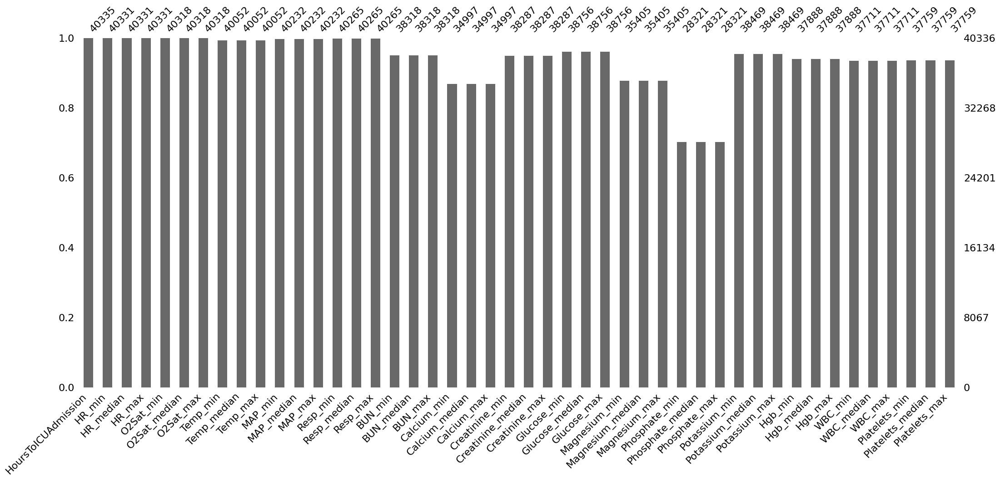

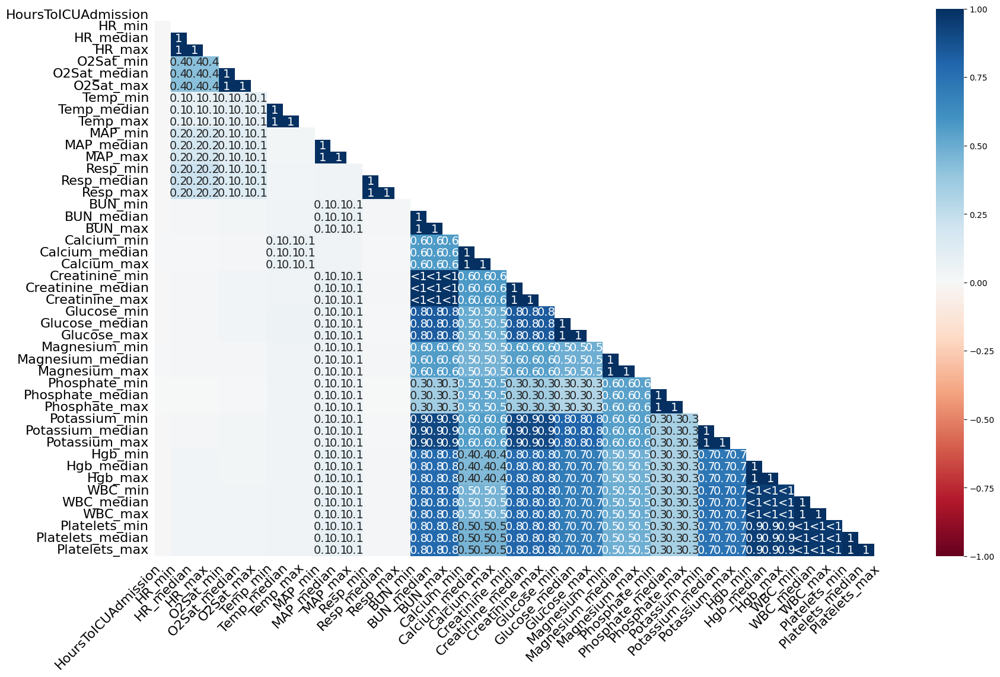

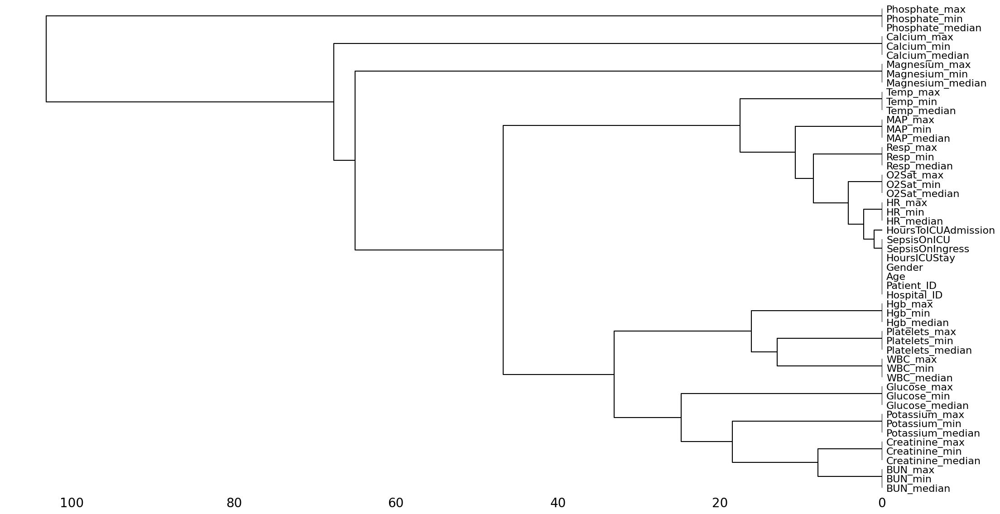

In [42]:
import missingno as msno
#Creating visualization of missing data
msno.bar(df.loc[:, df.isna().any()])
msno.heatmap(df)
msno.dendrogram(df)

En el dendograma vemos que hay asociacion entre los missing value de algunos datos de laboratorio, como explicamos en el video, tiene sentido con la forma de trabajar de una terapia intensiva. 

In [143]:
df.columns.tolist()[:8]

['Patient_ID',
 'Hospital_ID',
 'Age',
 'Gender',
 'HoursToICUAdmission',
 'HoursICUStay',
 'SepsisOnIngress',
 'SepsisOnICU']

Como son muchas columnas, vamos a trabajar solo con la mediana. 

La idea es que prueben con otras columnas (min, max) o que usen todas, o prueben con la diferencia/variacion (max-min) para cada variable

In [144]:
# Filtrar columnas que contienen "_median"
subset_median = df.filter(regex='_median')

# Mostrar el resultado
subset_median.head()

,HR_median,O2Sat_median,Temp_median,MAP_median,Resp_median,BUN_median,Calcium_median,Creatinine_median,Glucose_median,Magnesium_median,Phosphate_median,Potassium_median,Hgb_median,WBC_median,Platelets_median
0,104.0,91.0,36.725,87.915,25.0,18.0,9.45,0.7,163.0,2.10,3.5,4.2,12.35,10.2,327.5
1,60.0,97.0,36.110,65.000,12.0,100.0,7.90,2.5,78.0,2.50,4.4,5.1,9.70,11.0,158.0
2,81.0,95.0,37.585,81.000,26.0,30.0,11.00,0.9,113.0,2.40,2.4,3.8,9.10,8.7,486.0
3,105.0,98.0,36.390,67.835,18.0,16.5,8.20,0.8,84.0,2.05,3.8,4.3,8.30,7.6,182.0
4,73.5,97.0,37.220,87.000,16.0,7.0,8.20,0.6,128.0,2.20,2.8,3.6,14.40,8.0,276.0


In [145]:
columns_to_add = ['Hospital_ID',
 'Age',
 'Gender',
 'HoursToICUAdmission',
 'HoursICUStay',
 'SepsisOnIngress',
 'SepsisOnICU']

In [146]:
subset_median[columns_to_add] = df[columns_to_add]

/var/folders/t_/dcpbg3hd4k9bqxjh2_8bbv1h0000gn/T/ipykernel_68105/3094808486.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_median[columns_to_add] = df[columns_to_add]
/var/folders/t_/dcpbg3hd4k9bqxjh2_8bbv1h0000gn/T/ipykernel_68105/3094808486.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_median[columns_to_add] = df[columns_to_add]
/var/folders/t_/dcpbg3hd4k9bqxjh2_8bbv1h0000gn/T/ipykernel_68105/3094808486.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

Aca tenemos nuestro subset para correr inicial

In [147]:
subset_median.head()

,HR_median,O2Sat_median,Temp_median,MAP_median,Resp_median,BUN_median,Calcium_median,Creatinine_median,Glucose_median,Magnesium_median,Phosphate_median,Potassium_median,Hgb_median,WBC_median,Platelets_median,Hospital_ID,Age,Gender,HoursToICUAdmission,HoursICUStay,SepsisOnIngress,SepsisOnICU
0,104.0,91.0,36.725,87.915,25.0,18.0,9.45,0.7,163.0,2.10,3.5,4.2,12.35,10.2,327.5,Hospital A,83.0,0,0.0,54,0,0
1,60.0,97.0,36.110,65.000,12.0,100.0,7.90,2.5,78.0,2.50,4.4,5.1,9.70,11.0,158.0,Hospital A,76.0,0,99.0,23,0,0
2,81.0,95.0,37.585,81.000,26.0,30.0,11.00,0.9,113.0,2.40,2.4,3.8,9.10,8.7,486.0,Hospital A,46.0,0,1196.0,48,0,0
3,105.0,98.0,36.390,67.835,18.0,16.5,8.20,0.8,84.0,2.05,3.8,4.3,8.30,7.6,182.0,Hospital A,66.0,0,9.0,29,0,0
4,73.5,97.0,37.220,87.000,16.0,7.0,8.20,0.6,128.0,2.20,2.8,3.6,14.40,8.0,276.0,Hospital A,28.0,1,0.0,49,0,0


Hacemos un pairplot, esto tarda muchisimo, lo corremos solo para 1000 muestras

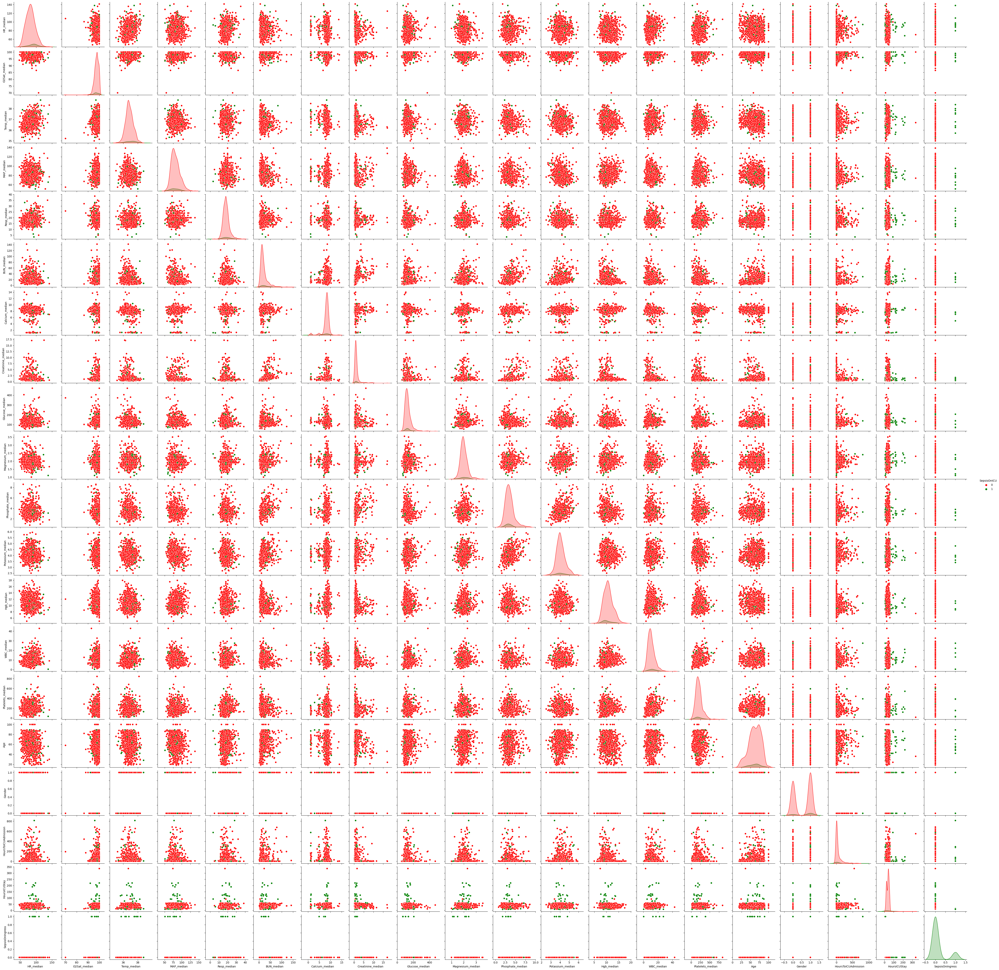

In [148]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(subset_median.sample(1000, random_state=42), hue="SepsisOnICU", palette = ['r', 'g'])
plt.show()

Hacemos un grafico de correlacion con Spearman, vemos que no hay correlación lineal significativa (>0.8) para ninguna variable. Solamente Urea y Creatinina que por ahora las dejamos. 

In [151]:
corr = subset_median.corr(method = 'spearman', numeric_only=True)
corr.style.background_gradient(cmap='coolwarm').format(precision = 2)

,HR_median,O2Sat_median,Temp_median,MAP_median,Resp_median,BUN_median,Calcium_median,Creatinine_median,Glucose_median,Magnesium_median,Phosphate_median,Potassium_median,Hgb_median,WBC_median,Platelets_median,Age,Gender,HoursToICUAdmission,HoursICUStay,SepsisOnIngress,SepsisOnICU
HR_median,1.00,-0.02,0.27,0.02,0.22,-0.05,-0.16,-0.06,0.10,-0.06,-0.06,0.04,-0.14,0.19,0.00,-0.16,-0.02,0.10,0.08,0.05,0.09
O2Sat_median,-0.02,1.00,0.05,-0.02,-0.18,-0.05,-0.10,-0.04,-0.02,-0.05,-0.03,-0.01,-0.20,-0.02,-0.05,-0.07,-0.07,-0.00,-0.00,0.03,0.03
Temp_median,0.27,0.05,1.00,-0.08,0.06,-0.20,-0.21,-0.15,0.06,-0.07,-0.17,-0.01,-0.10,0.20,-0.09,-0.09,0.05,0.04,0.11,0.00,0.07
MAP_median,0.02,-0.02,-0.08,1.00,0.02,-0.09,0.16,0.00,0.01,-0.07,-0.06,-0.18,0.20,-0.10,0.10,-0.20,0.01,-0.06,-0.01,-0.02,-0.04
Resp_median,0.22,-0.18,0.06,0.02,1.00,0.09,0.03,0.06,0.02,0.02,-0.04,-0.00,-0.02,0.05,0.07,0.07,0.00,0.01,0.07,0.02,0.07
BUN_median,-0.05,-0.05,-0.20,-0.09,0.09,1.00,0.07,0.72,0.11,0.23,0.39,0.32,-0.17,0.02,-0.11,0.33,0.13,0.04,0.08,0.05,0.10
Calcium_median,-0.16,-0.10,-0.21,0.16,0.03,0.07,1.00,0.09,-0.05,0.07,0.14,-0.02,0.31,-0.13,0.24,-0.01,-0.03,-0.16,-0.04,-0.02,-0.07
Creatinine_median,-0.06,-0.04,-0.15,0.00,0.06,0.72,0.09,1.00,0.05,0.20,0.40,0.29,-0.10,-0.05,-0.12,0.15,0.25,0.04,0.03,0.05,0.07
Glucose_median,0.10,-0.02,0.06,0.01,0.02,0.11,-0.05,0.05,1.00,0.03,-0.05,0.09,0.00,0.20,-0.02,0.07,0.03,0.05,0.02,0.01,0.04
Magnesium_median,-0.06,-0.05,-0.07,-0.07,0.02,0.23,0.07,0.20,0.03,1.00,0.11,0.19,0.01,0.07,-0.01,0.10,0.04,0.05,0.08,-0.01,0.02


In [150]:
subset_median.dtypes

HR_median              float64
O2Sat_median           float64
Temp_median            float64
MAP_median             float64
Resp_median            float64
BUN_median             float64
Calcium_median         float64
Creatinine_median      float64
Glucose_median         float64
Magnesium_median       float64
Phosphate_median       float64
Potassium_median       float64
Hgb_median             float64
WBC_median             float64
Platelets_median       float64
Hospital_ID             object
Age                    float64
Gender                   int64
HoursToICUAdmission    float64
HoursICUStay             int64
SepsisOnIngress          int64
SepsisOnICU              int64
dtype: object

Podemos crear otros graficos manualmente, si quisieramos, con pandas. Ver opciones posibles de kind en documentacion

https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.html

<Axes: ylabel='Density'>

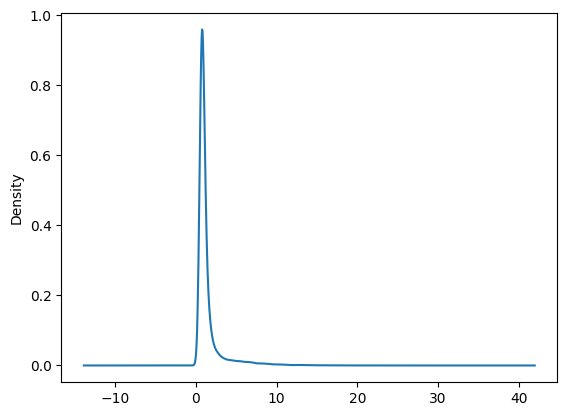

In [59]:
subset_median['Creatinine_median'].plot(kind='density')

Siempre hacer un describe para tener estadisticas basicas de nuestros datos

In [60]:
subset_median.describe()

,HR_median,O2Sat_median,Temp_median,MAP_median,Resp_median,BUN_median,Calcium_median,Creatinine_median,Glucose_median,Magnesium_median,Phosphate_median,Potassium_median,Hgb_median,WBC_median,Platelets_median,Hospital_ID,Age,Gender,HoursToICUAdmission,HoursICUStay,SepsisOnIngress,SepsisOnICU
count,40331.000000,40318.000000,40052.000000,40232.000000,40265.000000,38318.000000,34997.000000,38287.000000,38756.000000,35405.000000,28321.000000,38469.000000,37888.000000,37711.000000,37759.000000,40336.000000,40336.000000,40336.000000,40335.000000,40336.000000,40336.000000,40336.000000
mean,83.265714,97.448181,36.866487,82.015372,18.328072,21.958401,8.054353,1.429554,129.300193,2.018812,3.536567,4.085982,10.717330,11.018773,206.308925,1.247942,61.643123,0.559451,51.837957,39.010115,0.010561,0.072689
std,15.089318,2.194165,0.578984,12.859748,3.575972,17.972255,1.590536,1.771999,37.399837,0.322154,1.226213,0.495655,1.903773,6.574039,99.956005,0.825996,16.485608,0.496459,139.770977,22.924641,0.102225,0.259629
min,30.000000,27.000000,30.500000,22.000000,1.000000,1.000000,1.010000,0.100000,19.000000,0.500000,0.450000,1.575000,2.600000,0.100000,3.000000,0.000000,14.000000,0.000000,-24.000000,8.000000,0.000000,0.000000
25%,72.500000,96.000000,36.500000,73.000000,16.000000,11.000000,7.850000,0.700000,106.000000,1.800000,2.800000,3.800000,9.350000,7.550000,141.000000,1.000000,51.000000,0.000000,0.000000,24.000000,0.000000,0.000000
50%,82.000000,98.000000,36.830000,80.000000,18.000000,16.000000,8.300000,0.900000,122.500000,2.000000,3.350000,4.000000,10.550000,10.100000,191.000000,1.000000,63.000000,1.000000,6.000000,39.000000,0.000000,0.000000
75%,93.000000,99.000000,37.220000,90.000000,20.000000,25.500000,8.800000,1.300000,142.000000,2.200000,4.000000,4.310000,11.950000,13.200000,251.750000,2.000000,74.000000,1.000000,44.000000,47.000000,0.000000,0.000000
max,176.000000,100.000000,40.400000,144.000000,56.000000,232.000000,27.450000,28.000000,755.000000,8.400000,14.700000,9.800000,26.600000,319.250000,2322.000000,2.000000,100.000000,1.000000,5367.000000,336.000000,1.000000,1.000000


Aca obtenemos los nombres de nuestras variables que terminan con `_median`

In [64]:
features_names = df.filter(regex='_median').columns.tolist()

Aca corremos un loop y hacemos un boxplot para todas las features, separados por el `target` (SepsisOnICU)

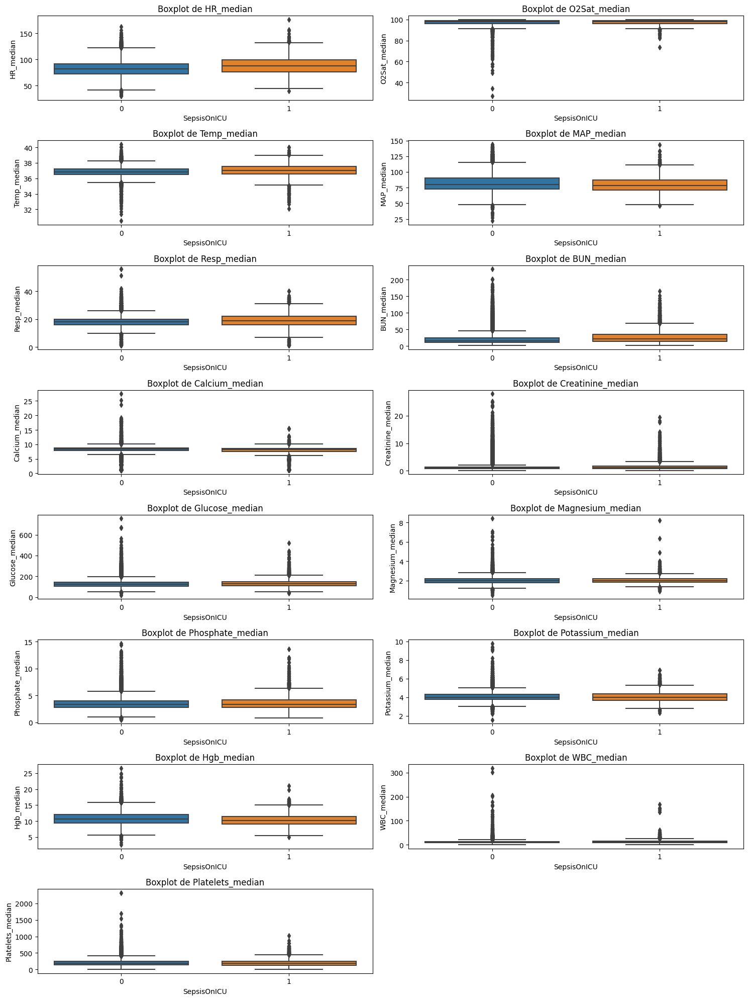

In [65]:
# Hacemos una lista con todos los nombres de las features
features_names = df.filter(regex='_median').columns.tolist()

# Calculamos cuantas features son
n_features = len(features_names)

# Establecemos 2 columnas para el gráfico
n_cols = 2 

# Calculamos el número de filas según la cantidad de features
n_rows = int(n_features / n_cols) + (n_features % n_cols > 0)

# Comenzamos a armar el gráfico
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))

for i, feature in enumerate(features_names):
    row = i // n_cols
    col = i % n_cols
    ax = axes[row, col]
    sns.boxplot(x="SepsisOnICU", y=feature, data=subset_median, ax=ax)
    ax.set_title(f"Boxplot de {feature}")

# Eliminar cualquier subplot vacío
for i in range(n_features, n_rows * n_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

Como sabemos, `Sklearn` no soporta strings en variables categoricas, convertimos `Hospital_ID` a un formato compatible con los modelos a correr

In [152]:
from sklearn.preprocessing import LabelEncoder

# Creamos el objeto para poder codificar nuestros labels
label_encoder = LabelEncoder()

# Aca directamente se hace fit_transform y automaticamente nos codifica a números los strings
subset_median['Hospital_ID'] = label_encoder.fit_transform(subset_median['Hospital_ID'])

# Vemos como quedó nuestro dataframe
subset_median.head()

/var/folders/t_/dcpbg3hd4k9bqxjh2_8bbv1h0000gn/T/ipykernel_68105/3271721427.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_median['Hospital_ID'] = label_encoder.fit_transform(subset_median['Hospital_ID'])


,HR_median,O2Sat_median,Temp_median,MAP_median,Resp_median,BUN_median,Calcium_median,Creatinine_median,Glucose_median,Magnesium_median,Phosphate_median,Potassium_median,Hgb_median,WBC_median,Platelets_median,Hospital_ID,Age,Gender,HoursToICUAdmission,HoursICUStay,SepsisOnIngress,SepsisOnICU
0,104.0,91.0,36.725,87.915,25.0,18.0,9.45,0.7,163.0,2.10,3.5,4.2,12.35,10.2,327.5,0,83.0,0,0.0,54,0,0
1,60.0,97.0,36.110,65.000,12.0,100.0,7.90,2.5,78.0,2.50,4.4,5.1,9.70,11.0,158.0,0,76.0,0,99.0,23,0,0
2,81.0,95.0,37.585,81.000,26.0,30.0,11.00,0.9,113.0,2.40,2.4,3.8,9.10,8.7,486.0,0,46.0,0,1196.0,48,0,0
3,105.0,98.0,36.390,67.835,18.0,16.5,8.20,0.8,84.0,2.05,3.8,4.3,8.30,7.6,182.0,0,66.0,0,9.0,29,0,0
4,73.5,97.0,37.220,87.000,16.0,7.0,8.20,0.6,128.0,2.20,2.8,3.6,14.40,8.0,276.0,0,28.0,1,0.0,49,0,0


Corroboramos que no hay ningun object

In [153]:
subset_median.dtypes

HR_median              float64
O2Sat_median           float64
Temp_median            float64
MAP_median             float64
Resp_median            float64
BUN_median             float64
Calcium_median         float64
Creatinine_median      float64
Glucose_median         float64
Magnesium_median       float64
Phosphate_median       float64
Potassium_median       float64
Hgb_median             float64
WBC_median             float64
Platelets_median       float64
Hospital_ID              int64
Age                    float64
Gender                   int64
HoursToICUAdmission    float64
HoursICUStay             int64
SepsisOnIngress          int64
SepsisOnICU              int64
dtype: object

In [68]:
subset_median.head()

,HR_median,O2Sat_median,Temp_median,MAP_median,Resp_median,BUN_median,Calcium_median,Creatinine_median,Glucose_median,Magnesium_median,Phosphate_median,Potassium_median,Hgb_median,WBC_median,Platelets_median,Hospital_ID,Age,Gender,HoursToICUAdmission,HoursICUStay,SepsisOnIngress,SepsisOnICU
0,104.0,91.0,36.725,87.915,25.0,18.0,9.45,0.7,163.0,2.10,3.5,4.2,12.35,10.2,327.5,0,83.0,0,0.0,54,0,0
1,60.0,97.0,36.110,65.000,12.0,100.0,7.90,2.5,78.0,2.50,4.4,5.1,9.70,11.0,158.0,0,76.0,0,99.0,23,0,0
2,81.0,95.0,37.585,81.000,26.0,30.0,11.00,0.9,113.0,2.40,2.4,3.8,9.10,8.7,486.0,0,46.0,0,1196.0,48,0,0
3,105.0,98.0,36.390,67.835,18.0,16.5,8.20,0.8,84.0,2.05,3.8,4.3,8.30,7.6,182.0,0,66.0,0,9.0,29,0,0
4,73.5,97.0,37.220,87.000,16.0,7.0,8.20,0.6,128.0,2.20,2.8,3.6,14.40,8.0,276.0,0,28.0,1,0.0,49,0,0


Dejamos solamente la variable `SepsisOnICU`, la renombramos a `Sepsis`

No nos interesa si el hubo sepsis al ingreso o no, aunque esto se podria explorar. 

In [154]:
subset_median.rename(columns={'SepsisOnICU':'Sepsis'}, inplace=True)

subset_median.drop('SepsisOnIngress', axis =1, inplace=True)

/var/folders/t_/dcpbg3hd4k9bqxjh2_8bbv1h0000gn/T/ipykernel_68105/1516823218.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_median.drop('SepsisOnIngress', axis =1, inplace=True)


In [158]:
subset_median['Sepsis'].value_counts()

0    37404
1     2932
Name: Sepsis, dtype: int64

In [159]:
subset_median.head()

,HR_median,O2Sat_median,Temp_median,MAP_median,Resp_median,BUN_median,Calcium_median,Creatinine_median,Glucose_median,Magnesium_median,Phosphate_median,Potassium_median,Hgb_median,WBC_median,Platelets_median,Hospital_ID,Age,Gender,HoursToICUAdmission,HoursICUStay,Sepsis
0,104.0,91.0,36.725,87.915,25.0,18.0,9.45,0.7,163.0,2.10,3.5,4.2,12.35,10.2,327.5,0,83.0,0,0.0,54,0
1,60.0,97.0,36.110,65.000,12.0,100.0,7.90,2.5,78.0,2.50,4.4,5.1,9.70,11.0,158.0,0,76.0,0,99.0,23,0
2,81.0,95.0,37.585,81.000,26.0,30.0,11.00,0.9,113.0,2.40,2.4,3.8,9.10,8.7,486.0,0,46.0,0,1196.0,48,0
3,105.0,98.0,36.390,67.835,18.0,16.5,8.20,0.8,84.0,2.05,3.8,4.3,8.30,7.6,182.0,0,66.0,0,9.0,29,0
4,73.5,97.0,37.220,87.000,16.0,7.0,8.20,0.6,128.0,2.20,2.8,3.6,14.40,8.0,276.0,0,28.0,1,0.0,49,0


Generamos nuestro `X` e `y`

In [163]:
y = subset_median['Sepsis'].values
X = subset_median.drop('Sepsis', axis=1).values

In [164]:
y.shape

(40336,)

Hacemos split de nuestros datasets y hacemos imputacion de los datos y escalado de los mismos 

Si quieren aprender otros metodos de imputacion: https://towardsdatascience.com/imputing-missing-data-with-simple-and-advanced-techniques-f5c7b157fb87

In [213]:
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay, f1_score, roc_curve, auc, RocCurveDisplay


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Imputacion
imp_cat = SimpleImputer(strategy="median")
X_train = imp_cat.fit_transform(X_train)
X_test = imp_cat.transform(X_test)

#Escalado
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


Corremos un arbol de decision

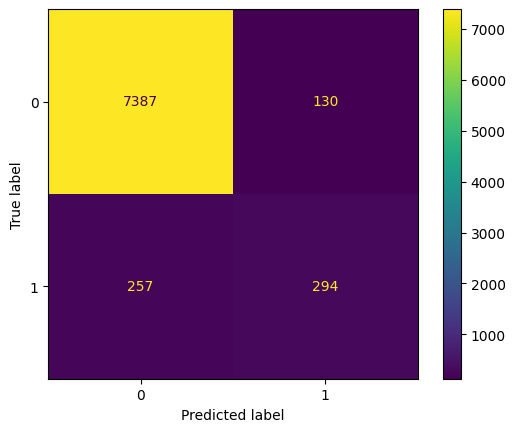

In [166]:
from sklearn.tree import DecisionTreeClassifier

# Crear el modelo
tree = DecisionTreeClassifier(max_depth = 2, random_state = 42) 

# Entrenar el modelo
tree.fit(X_train, y_train)

# Hacer predicciones
predictions = tree.predict(X_test)

# Vemos la matriz de confusión
conf_matrix = confusion_matrix(y_test, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=tree.classes_)
disp.plot()
plt.show()

Recordar que en datasets desbalanceados, el `accuracy` siempre va a dar alto

In [169]:
# Calculamos las métricas
accuracy = round(accuracy_score(y_test, predictions),2)
precision = round(precision_score(y_test, predictions),2)
recall = round(recall_score(y_test, predictions),2)
f1score = round(f1_score(y_test, predictions),2)

print("Accuracy:", accuracy)
print("Precisión:", precision)
print("Sensibilidad:", recall)
print("F1 Score:", f1score)

Accuracy: 0.95
Precisión: 0.69
Sensibilidad: 0.53
F1 Score: 0.6


In [170]:
# Vemos el reporte de clasificacion
print("Reporte de clasificación:\n", classification_report(y_test, predictions))

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.97      0.98      0.97      7517
           1       0.69      0.53      0.60       551

    accuracy                           0.95      8068
   macro avg       0.83      0.76      0.79      8068
weighted avg       0.95      0.95      0.95      8068



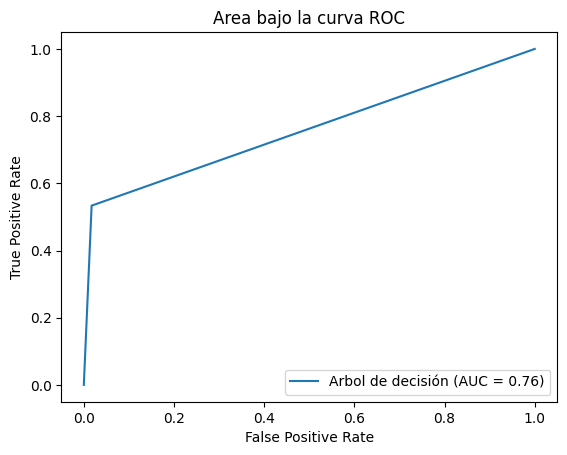

In [171]:
# Hacemos la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, predictions)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='Arbol de decisión')
display.plot()
plt.title('Area bajo la curva ROC')
plt.show()

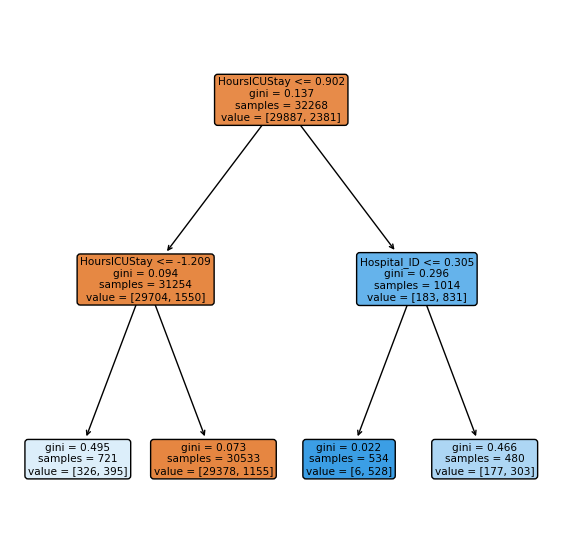

In [172]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Visualiza el árbol
plt.figure(figsize=(7, 7))

# Se puede setear impurity True para ver el error de cada división
# En este caso es el score de Gini
plot_tree(tree, filled=True, feature_names=subset_median.drop('Sepsis', axis=1).columns.tolist(), rounded=True, impurity = True)

plt.show()

In [173]:
subset_median.head()

,HR_median,O2Sat_median,Temp_median,MAP_median,Resp_median,BUN_median,Calcium_median,Creatinine_median,Glucose_median,Magnesium_median,Phosphate_median,Potassium_median,Hgb_median,WBC_median,Platelets_median,Hospital_ID,Age,Gender,HoursToICUAdmission,HoursICUStay,Sepsis
0,104.0,91.0,36.725,87.915,25.0,18.0,9.45,0.7,163.0,2.10,3.5,4.2,12.35,10.2,327.5,0,83.0,0,0.0,54,0
1,60.0,97.0,36.110,65.000,12.0,100.0,7.90,2.5,78.0,2.50,4.4,5.1,9.70,11.0,158.0,0,76.0,0,99.0,23,0
2,81.0,95.0,37.585,81.000,26.0,30.0,11.00,0.9,113.0,2.40,2.4,3.8,9.10,8.7,486.0,0,46.0,0,1196.0,48,0
3,105.0,98.0,36.390,67.835,18.0,16.5,8.20,0.8,84.0,2.05,3.8,4.3,8.30,7.6,182.0,0,66.0,0,9.0,29,0
4,73.5,97.0,37.220,87.000,16.0,7.0,8.20,0.6,128.0,2.20,2.8,3.6,14.40,8.0,276.0,0,28.0,1,0.0,49,0


Aca graficamos los puntos normalizados para las variables HR_mediam y Temp_median. Esto nos sirve para entender mejor K vecinos! 

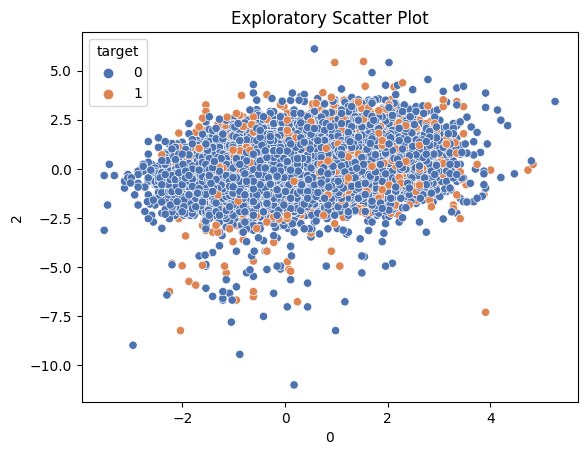

In [207]:
df_normalized = pd.DataFrame(X_train)
df_normalized["target"] = y_train

posicion_hr = subset_median.columns.get_loc('HR_median')

posicion_temp = subset_median.columns.get_loc('Temp_median')

# Create the scatter plot
sns.scatterplot(data=df_normalized,x=posicion_hr,y=posicion_temp,hue=df_normalized['target'],palette='deep')
plt.title('Exploratory Scatter Plot')
plt.show()


In [208]:
from sklearn.neighbors import KNeighborsClassifier

# Crear el modelo
knn = KNeighborsClassifier(n_neighbors = 3)


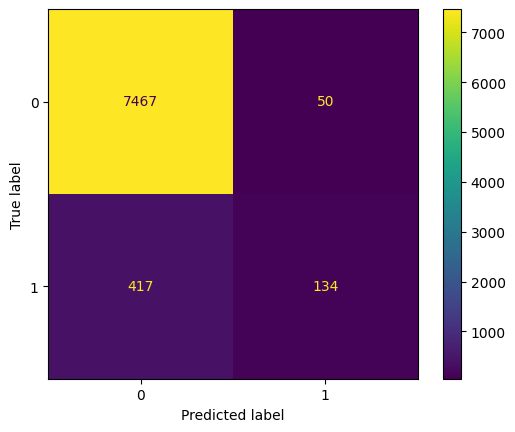

In [209]:
# Entrenar el modelo
knn.fit(X_train, y_train)

# Hacer predicciones
predictions = knn.predict(X_test)

# Vemos la matriz de confusión
conf_matrix = confusion_matrix(y_test, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=knn.classes_)
disp.plot()
plt.show()

In [210]:
# Calculamos las métricas
accuracy = round(accuracy_score(y_test, predictions),2)
precision = round(precision_score(y_test, predictions),2)
recall = round(recall_score(y_test, predictions),2)
f1score = round(f1_score(y_test, predictions),2)

print("Accuracy:", accuracy)
print("Precisión:", precision)
print("Sensibilidad:", recall)
print("F1 Score:", f1score)

Accuracy: 0.94
Precisión: 0.73
Sensibilidad: 0.24
F1 Score: 0.36


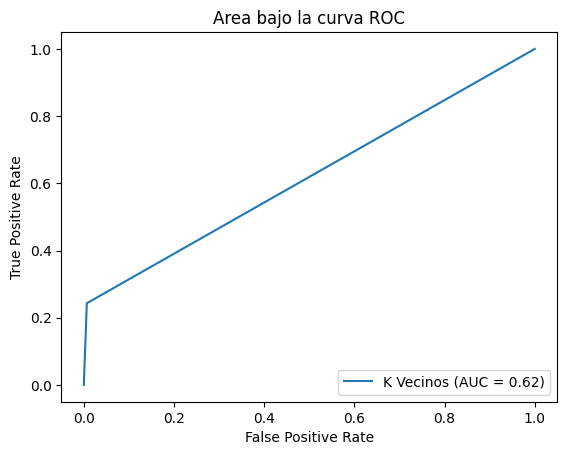

In [211]:
# Hacemos la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, predictions)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='K Vecinos')
display.plot()
plt.title('Area bajo la curva ROC')
plt.show()

Aca podemos ver en este grafico cual seria el numero optimo de K vecinos para nuestro dataset....los graficos no son alentadores. Vuelvan a correrlo con otro subset (por ejemplo min o max) a ver como cambia

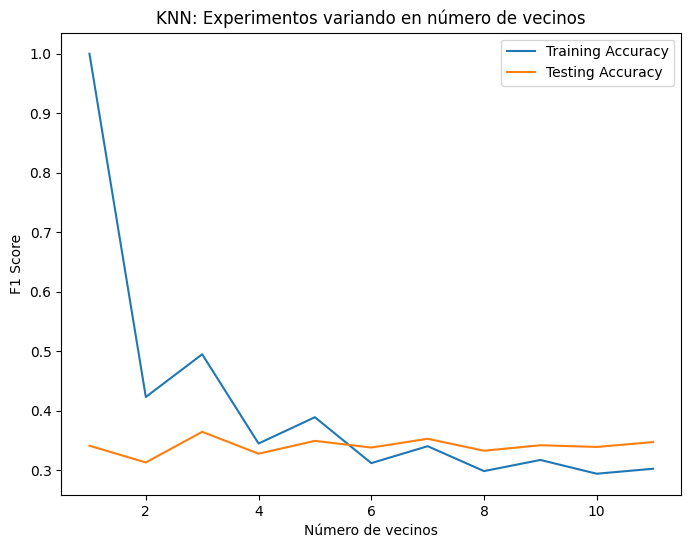

In [215]:
# Diccionarios para guardar nuestros resultados del loop
train_f1score = {}
test_f1score = {}

import numpy as np

# Creamos una lista de numeros del 1 al 12
neighbors = np.arange(1, 12)

# En el loop vamos probando aumentar los vecinos y guardamos las métricas. 
for neighbor in neighbors:
    knn = KNeighborsClassifier(n_neighbors=neighbor)
    knn.fit(X_train, y_train)

    predictions_train = knn.predict(X_train)
    
    train_f1score[neighbor] = f1_score(y_train, predictions_train)

    predictions_test = knn.predict(X_test)

    test_f1score[neighbor] = f1_score(y_test, predictions_test)


# Finalizado el loop, hacemos un gráfico
plt.figure(figsize=(8, 6))
plt.title("KNN: Experimentos variando en número de vecinos")
plt.plot(neighbors, train_f1score.values(), label="Training Accuracy")
plt.plot(neighbors, test_f1score.values(), label="Testing Accuracy")
plt.legend()
plt.xlabel("Número de vecinos")
plt.ylabel("F1 Score")
plt.show()

Aca en Random Forest vemos que tenemos una precision muy alta a expensas de una sensibilidad muy mala. 

¿Se podra mejorar? ¿Es malo esto? Depende de nuestro objetivo! 

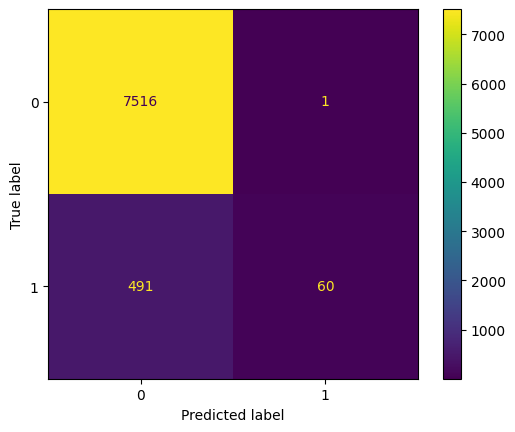

In [216]:
# Importación de bibliotecas necesarias
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import plot_tree

# Dividir el conjunto de datos en entrenamiento y prueba (70% entrenamiento, 30% prueba)
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Instanciar un clasificador de bosques aleatorios con 400 estimadores
rf = RandomForestClassifier(n_estimators=400, max_depth= 3, random_state=42)

# Entrenar el clasificador en el conjunto de entrenamiento
rf.fit(X_train, y_train)

# Predecir las etiquetas del conjunto de prueba
predictions = rf.predict(X_test)

# Vemos la matriz de confusión
conf_matrix = confusion_matrix(y_test, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=rf.classes_)
disp.plot()
plt.show()

In [217]:
# Calculamos las métricas
accuracy = round(accuracy_score(y_test, predictions),2)
precision = round(precision_score(y_test, predictions),2)
recall = round(recall_score(y_test, predictions),2)
f1score = round(f1_score(y_test, predictions),2)

print("Accuracy:", accuracy)
print("Precisión:", precision)
print("Sensibilidad:", recall)
print("F1 Score:", f1score)

Accuracy: 0.94
Precisión: 0.98
Sensibilidad: 0.11
F1 Score: 0.2


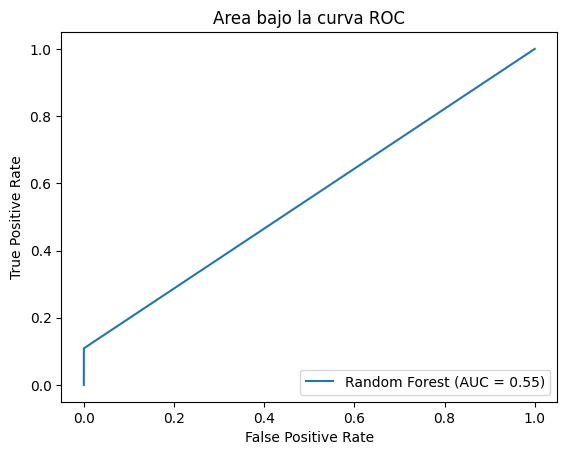

In [219]:
# Hacemos la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, predictions)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='Random Forest')
display.plot()
plt.title('Area bajo la curva ROC')
plt.show()

Como vemos en el feature importance, las variables mas importantes en sepsis, son las que tienen un sentido biologico

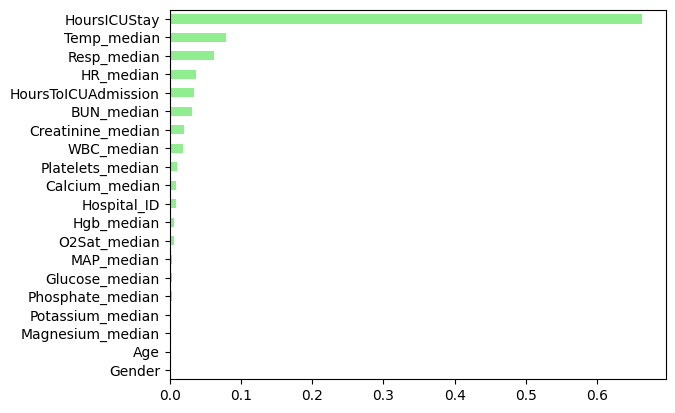

In [220]:
# Crear una Serie de pandas con la importancia de las características
importances_rf = pd.Series(rf.feature_importances_, index=subset_median.drop('Sepsis', axis=1).columns.tolist())

# Ordenar importances_rf
sorted_importances_rf = importances_rf.sort_values()

# Hacer un gráfico de barras horizontal
sorted_importances_rf.plot(kind='barh', color='lightgreen')

plt.show()

Tarea para el hogar: 

1) ¿Podremos hacer lo mismo para las otras variables? 
2) ¿Se puede hacer alguna transformacion para estas variables?

In [286]:
nombres = [x.split('_')[0] + '_diff' for x in df.filter(regex='_max').columns.tolist()]

nombres

['HR_diff',
 'O2Sat_diff',
 'Temp_diff',
 'MAP_diff',
 'Resp_diff',
 'BUN_diff',
 'Calcium_diff',
 'Creatinine_diff',
 'Glucose_diff',
 'Magnesium_diff',
 'Phosphate_diff',
 'Potassium_diff',
 'Hgb_diff',
 'WBC_diff',
 'Platelets_diff']

Aca calculamos la diferencia entre los valores maximos y minimos registrados para cada paciente

Hay 4 formas de calcular estas diferencias! Elijan su propia aventura descomentando otro y dejando otro a mano

In [347]:
df_diff = pd.DataFrame(df.filter(regex='_max').values - df.filter(regex='_min').values)

#df_diff = pd.DataFrame(df.filter(regex='_max').values / df.filter(regex='_min').values)

#df_diff = pd.DataFrame(df.filter(regex='_max').values / df.filter(regex='_min').values * df.filter(regex='_median').values)

#df_diff = pd.DataFrame(df.filter(regex='_median').values / (df.filter(regex='_max').values / df.filter(regex='_min').values))

df_diff.columns = nombres

df_diff.head()

,HR_diff,O2Sat_diff,Temp_diff,MAP_diff,Resp_diff,BUN_diff,Calcium_diff,Creatinine_diff,Glucose_diff,Magnesium_diff,Phosphate_diff,Potassium_diff,Hgb_diff,WBC_diff,Platelets_diff
0,41.0,15.0,1.33,97.33,15.0,8.0,0.3,0.0,60.0,0.2,0.4,0.8,0.3,9.0,21.0
1,40.0,6.0,0.44,65.50,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,25.0,8.0,1.72,36.33,23.0,6.0,0.2,0.1,79.0,0.1,0.6,0.7,2.2,1.7,23.0
3,20.0,4.5,0.72,50.00,12.0,5.0,0.0,0.0,184.0,0.7,0.0,1.0,0.0,0.0,76.0
4,27.0,3.0,1.11,30.00,7.0,3.0,0.7,0.1,35.0,0.6,0.2,0.9,1.3,3.4,15.0


In [348]:
subset_median.head()

,HR_median,O2Sat_median,Temp_median,MAP_median,Resp_median,BUN_median,Calcium_median,Creatinine_median,Glucose_median,Magnesium_median,Phosphate_median,Potassium_median,Hgb_median,WBC_median,Platelets_median,Hospital_ID,Age,Gender,HoursToICUAdmission,HoursICUStay,Sepsis
0,104.0,91.0,36.725,87.915,25.0,18.0,9.45,0.7,163.0,2.10,3.5,4.2,12.35,10.2,327.5,0,83.0,0,0.0,54,0
1,60.0,97.0,36.110,65.000,12.0,100.0,7.90,2.5,78.0,2.50,4.4,5.1,9.70,11.0,158.0,0,76.0,0,99.0,23,0
2,81.0,95.0,37.585,81.000,26.0,30.0,11.00,0.9,113.0,2.40,2.4,3.8,9.10,8.7,486.0,0,46.0,0,1196.0,48,0
3,105.0,98.0,36.390,67.835,18.0,16.5,8.20,0.8,84.0,2.05,3.8,4.3,8.30,7.6,182.0,0,66.0,0,9.0,29,0
4,73.5,97.0,37.220,87.000,16.0,7.0,8.20,0.6,128.0,2.20,2.8,3.6,14.40,8.0,276.0,0,28.0,1,0.0,49,0


In [349]:
columns_to_add = ['Hospital_ID',
 'Age',
 'Gender',
 'HoursToICUAdmission',
 'HoursICUStay',
 'Sepsis']

Aca pueden elegir poner las columnas `median` o usar solo las calculadas, elijan descomentado la otra opcion! 

In [350]:
df_final = df_diff.copy()

#df_final = pd.concat([df_final, subset_median[columns_to_add]], axis =1)

df_final = pd.concat([df_final, subset_median], axis =1)

df_final.head()

,HR_diff,O2Sat_diff,Temp_diff,MAP_diff,Resp_diff,BUN_diff,Calcium_diff,Creatinine_diff,Glucose_diff,Magnesium_diff,Phosphate_diff,Potassium_diff,Hgb_diff,WBC_diff,Platelets_diff,HR_median,O2Sat_median,Temp_median,MAP_median,Resp_median,BUN_median,Calcium_median,Creatinine_median,Glucose_median,Magnesium_median,Phosphate_median,Potassium_median,Hgb_median,WBC_median,Platelets_median,Hospital_ID,Age,Gender,HoursToICUAdmission,HoursICUStay,Sepsis
0,41.0,15.0,1.33,97.33,15.0,8.0,0.3,0.0,60.0,0.2,0.4,0.8,0.3,9.0,21.0,104.0,91.0,36.725,87.915,25.0,18.0,9.45,0.7,163.0,2.10,3.5,4.2,12.35,10.2,327.5,0,83.0,0,0.0,54,0
1,40.0,6.0,0.44,65.50,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0,97.0,36.110,65.000,12.0,100.0,7.90,2.5,78.0,2.50,4.4,5.1,9.70,11.0,158.0,0,76.0,0,99.0,23,0
2,25.0,8.0,1.72,36.33,23.0,6.0,0.2,0.1,79.0,0.1,0.6,0.7,2.2,1.7,23.0,81.0,95.0,37.585,81.000,26.0,30.0,11.00,0.9,113.0,2.40,2.4,3.8,9.10,8.7,486.0,0,46.0,0,1196.0,48,0
3,20.0,4.5,0.72,50.00,12.0,5.0,0.0,0.0,184.0,0.7,0.0,1.0,0.0,0.0,76.0,105.0,98.0,36.390,67.835,18.0,16.5,8.20,0.8,84.0,2.05,3.8,4.3,8.30,7.6,182.0,0,66.0,0,9.0,29,0
4,27.0,3.0,1.11,30.00,7.0,3.0,0.7,0.1,35.0,0.6,0.2,0.9,1.3,3.4,15.0,73.5,97.0,37.220,87.000,16.0,7.0,8.20,0.6,128.0,2.20,2.8,3.6,14.40,8.0,276.0,0,28.0,1,0.0,49,0


In [351]:
from sklearn.preprocessing import LabelEncoder

# Creamos el objeto para poder codificar nuestros labels
label_encoder = LabelEncoder()

# Aca directamente se hace fit_transform y automaticamente nos codifica a números los strings
df_final['Hospital_ID'] = label_encoder.fit_transform(df_final['Hospital_ID'])

# Vemos como quedó nuestro dataframe
df_final.head()

,HR_diff,O2Sat_diff,Temp_diff,MAP_diff,Resp_diff,BUN_diff,Calcium_diff,Creatinine_diff,Glucose_diff,Magnesium_diff,Phosphate_diff,Potassium_diff,Hgb_diff,WBC_diff,Platelets_diff,HR_median,O2Sat_median,Temp_median,MAP_median,Resp_median,BUN_median,Calcium_median,Creatinine_median,Glucose_median,Magnesium_median,Phosphate_median,Potassium_median,Hgb_median,WBC_median,Platelets_median,Hospital_ID,Age,Gender,HoursToICUAdmission,HoursICUStay,Sepsis
0,41.0,15.0,1.33,97.33,15.0,8.0,0.3,0.0,60.0,0.2,0.4,0.8,0.3,9.0,21.0,104.0,91.0,36.725,87.915,25.0,18.0,9.45,0.7,163.0,2.10,3.5,4.2,12.35,10.2,327.5,0,83.0,0,0.0,54,0
1,40.0,6.0,0.44,65.50,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0,97.0,36.110,65.000,12.0,100.0,7.90,2.5,78.0,2.50,4.4,5.1,9.70,11.0,158.0,0,76.0,0,99.0,23,0
2,25.0,8.0,1.72,36.33,23.0,6.0,0.2,0.1,79.0,0.1,0.6,0.7,2.2,1.7,23.0,81.0,95.0,37.585,81.000,26.0,30.0,11.00,0.9,113.0,2.40,2.4,3.8,9.10,8.7,486.0,0,46.0,0,1196.0,48,0
3,20.0,4.5,0.72,50.00,12.0,5.0,0.0,0.0,184.0,0.7,0.0,1.0,0.0,0.0,76.0,105.0,98.0,36.390,67.835,18.0,16.5,8.20,0.8,84.0,2.05,3.8,4.3,8.30,7.6,182.0,0,66.0,0,9.0,29,0
4,27.0,3.0,1.11,30.00,7.0,3.0,0.7,0.1,35.0,0.6,0.2,0.9,1.3,3.4,15.0,73.5,97.0,37.220,87.000,16.0,7.0,8.20,0.6,128.0,2.20,2.8,3.6,14.40,8.0,276.0,0,28.0,1,0.0,49,0


In [352]:
X = df_final.drop('Sepsis', axis=1).values
y = df_final['Sepsis'].values

In [353]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay, f1_score, roc_curve, auc, RocCurveDisplay

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

#Imputacion
imp_cat = SimpleImputer(strategy="median")
X_train = imp_cat.fit_transform(X_train)
X_test = imp_cat.transform(X_test)

#Escalado
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


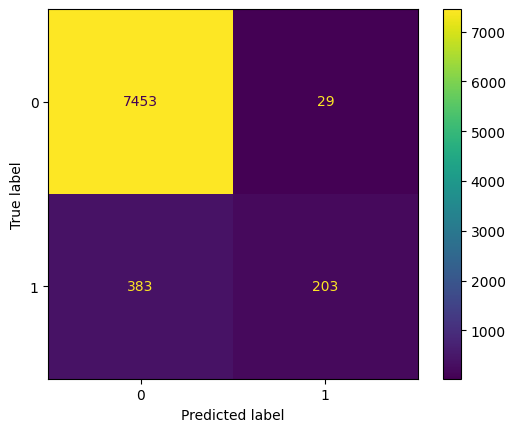

In [354]:
# Importación de bibliotecas necesarias
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import plot_tree

# Dividir el conjunto de datos en entrenamiento y prueba (70% entrenamiento, 30% prueba)
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Instanciar un clasificador de bosques aleatorios con 400 estimadores
rf = RandomForestClassifier(n_estimators=400, max_depth= 8, random_state=42)

# Entrenar el clasificador en el conjunto de entrenamiento
rf.fit(X_train, y_train)

# Predecir las etiquetas del conjunto de prueba
predictions = rf.predict(X_test)

# Vemos la matriz de confusión
conf_matrix = confusion_matrix(y_test, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=rf.classes_)
disp.plot()
plt.show()

In [344]:
# Calculamos las métricas
accuracy = round(accuracy_score(y_test, predictions),2)
precision = round(precision_score(y_test, predictions),2)
recall = round(recall_score(y_test, predictions),2)
f1score = round(f1_score(y_test, predictions),2)

print("Accuracy:", accuracy)
print("Precisión:", precision)
print("Sensibilidad:", recall)
print("F1 Score:", f1score)

Accuracy: 0.95
Precisión: 0.88
Sensibilidad: 0.35
F1 Score: 0.5


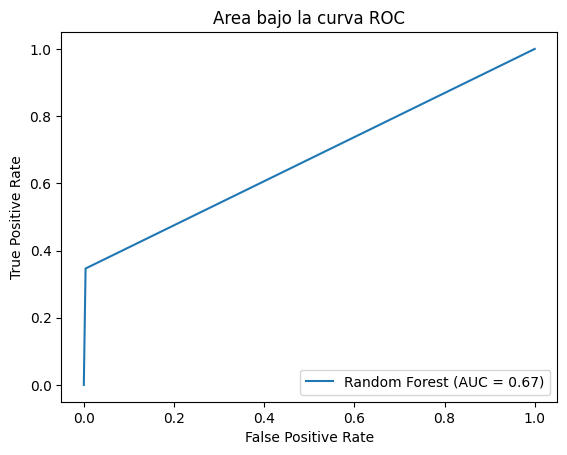

In [355]:
# Hacemos la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, predictions)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='Random Forest')
display.plot()
plt.title('Area bajo la curva ROC')
plt.show()

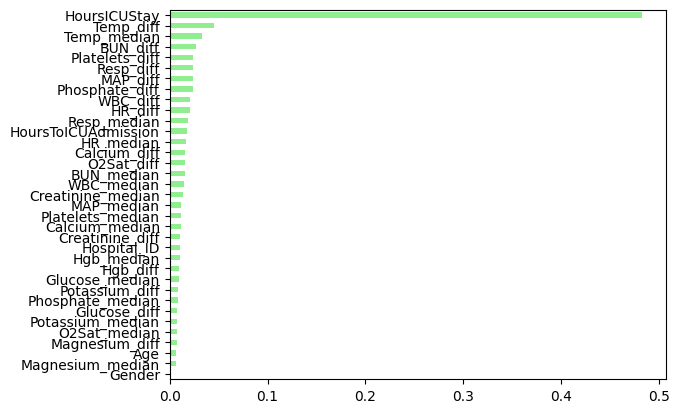

In [356]:
# Crear una Serie de pandas con la importancia de las características
importances_rf = pd.Series(rf.feature_importances_, index=df_final.drop('Sepsis', axis=1).columns.tolist())

# Ordenar importances_rf
sorted_importances_rf = importances_rf.sort_values()

# Hacer un gráfico de barras horizontal
sorted_importances_rf.plot(kind='barh', color='lightgreen')

plt.show()

CLASIFICACION! TAREA ADICIONAL para el tiempo libre! 

* ¿Pueden probar otros modelos?
* ¿Pueden probar clusterizar pacientes y usar la etiqueta de ese cluster como `feature`? Por ejemplo con los signos vitales! 
* ¿Pueden probar hacer analisis de componentes principales? Por ejemplo, hacer 1 PCA para los signos vitales (HR, TAM, TEMP, RESP, SATO2) y usar ese componente como `feature` omitiendo los signos vitales? 
* ¿Y otro PCA para laboratorio? 

REGRESION:
* Encaren un modelo que utilice como variable predictora la variable `HoursICUStay` para predecir los dias de internacion. 
* ¿Pueden probar las tecnicas de analisis no supervisado con estos modelos? 